<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/original_vit2_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 6.6 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 68.6MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=128)
parser.add_argument("--nch_d", type = int, default=128)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=128, nch_d=128, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)#(B,H*W softmax, H*W)

        o =torch.bmm(hx, attention)#(b,c,h*w )*(B,H*W softmax, H*W) -> (b,c,h*w)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
       # x = self.se_block_0(x)
        x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
        b, c, h, w = x.size()
        #x = self.conv1(x)
       # x= self.flat(x)
        #print(x.size())

        x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
        x = self.linear_2(x).view(b, -1, h, w)

        #x = x.view(b, -1, h, w)
        #print(x.size())
        #print(self.shortcut(identity).size())
        x =  self.shortcut(identity) + x

        #x = self.se_block_1(x)
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): Conv

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [02:50<00:00,  1.66s/it]


epoch: 0, lossD:2.135265679035372, lossG:4.434029083807491,lossG_fake:2.2771527801902547, lossG_real:2.1568763001451217 ,equality:0.12027648004513303


evaluate:121.4006576538086,kid_mean:0.09192558377981186, kid_std:0.015438759699463844,kid_:(tensor(0.0919), tensor(0.0154))


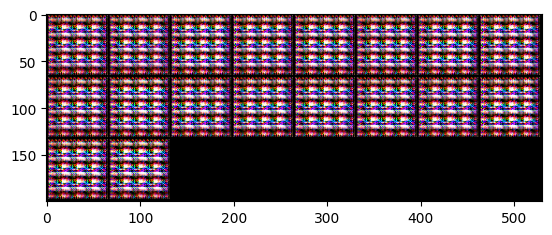

100%|██████████| 103/103 [01:34<00:00,  1.09it/s]


epoch: 1, lossD:1.787710649295918, lossG:3.3889193303376723,lossG_fake:1.889209080668329, lossG_real:1.499710242725113 ,equality:0.38949883794321605


evaluate:102.33187866210938,kid_mean:0.060178350657224655, kid_std:0.02493487112224102,kid_:(tensor(0.0602), tensor(0.0249))


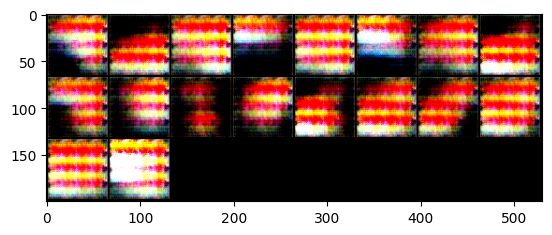

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 2, lossD:2.0110279460555143, lossG:2.3300956776998576,lossG_fake:1.2207105495397328, lossG_real:1.1093851287388108 ,equality:0.111325420800922


evaluate:95.00890350341797,kid_mean:0.05694959685206413, kid_std:0.030407775193452835,kid_:(tensor(0.0569), tensor(0.0304))


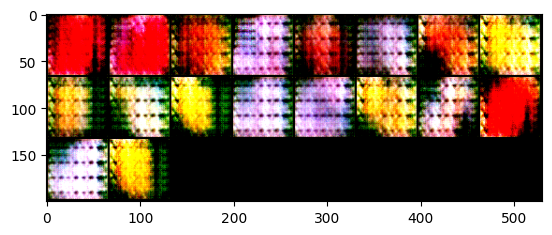

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 3, lossD:2.0317015728904204, lossG:2.078801483783907,lossG_fake:1.0575338133330483, lossG_real:1.0212676658213717 ,equality:0.03626614751167656


evaluate:95.46892547607422,kid_mean:0.05508102476596832, kid_std:0.03044276311993599,kid_:(tensor(0.0551), tensor(0.0304))


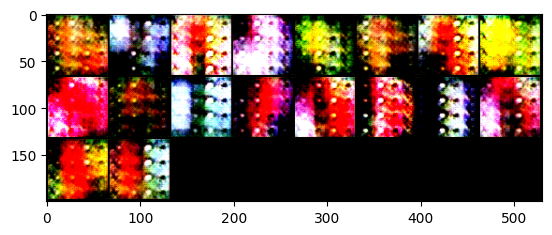

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 4, lossD:1.9959563584003635, lossG:2.10098007350292,lossG_fake:1.0878570490670436, lossG_real:1.0131230140195309 ,equality:0.07473403504751275


evaluate:104.26227569580078,kid_mean:0.060416508466005325, kid_std:0.03011261858046055,kid_:(tensor(0.0604), tensor(0.0301))


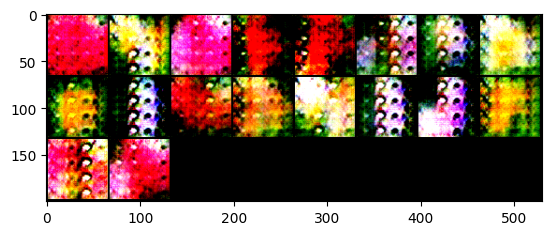

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 5, lossD:2.0262989581209943, lossG:2.100695776707918,lossG_fake:1.0852758473562962, lossG_real:1.0154199160418464 ,equality:0.06985593131444978


evaluate:96.43645477294922,kid_mean:0.05291629955172539, kid_std:0.027969907969236374,kid_:(tensor(0.0529), tensor(0.0280))


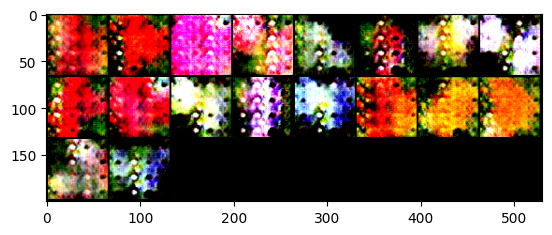

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 6, lossD:2.012090171425088, lossG:2.073998911866864,lossG_fake:1.0761144734123378, lossG_real:0.9978844442413849 ,equality:0.0782300291709529


evaluate:93.05184936523438,kid_mean:0.05658799037337303, kid_std:0.03463135287165642,kid_:(tensor(0.0566), tensor(0.0346))


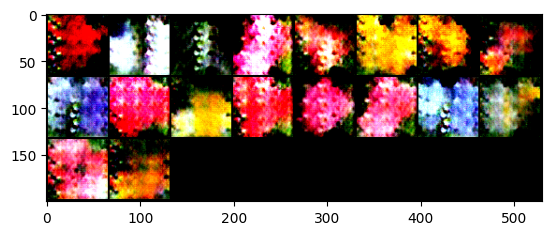

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 7, lossD:2.011321877970279, lossG:2.068462874125508,lossG_fake:1.0651804914752256, lossG_real:1.003282390173199 ,equality:0.061898101302026554


evaluate:96.48542022705078,kid_mean:0.05376788601279259, kid_std:0.02933834306895733,kid_:(tensor(0.0538), tensor(0.0293))


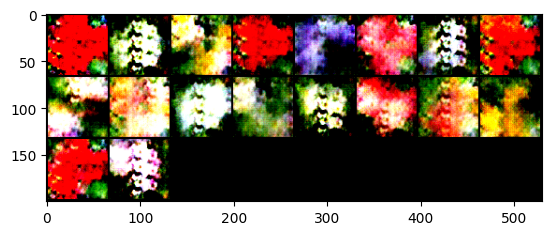

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 8, lossD:2.0305031931516035, lossG:2.089450433416274,lossG_fake:1.0573855435963972, lossG_real:1.0320648863477615 ,equality:0.025320657248635747


evaluate:90.97175598144531,kid_mean:0.0528077632188797, kid_std:0.03205785155296326,kid_:(tensor(0.0528), tensor(0.0321))


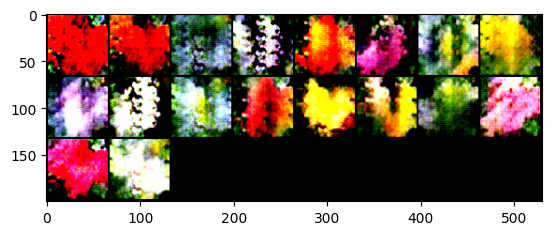

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 9, lossD:2.0039576743412946, lossG:2.044504230462232,lossG_fake:1.0350873331421788, lossG_real:1.0094168950053095 ,equality:0.02567043813686931


evaluate:97.0684814453125,kid_mean:0.055871229618787766, kid_std:0.030341029167175293,kid_:(tensor(0.0559), tensor(0.0303))


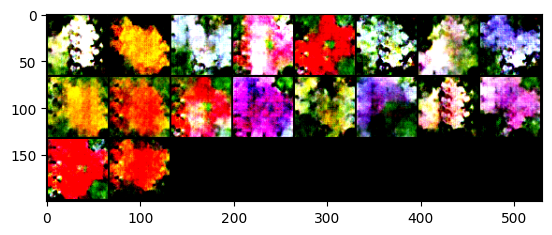

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 10, lossD:2.0049463383202415, lossG:2.0611772236314794,lossG_fake:1.0592123067494734, lossG_real:1.0019649232475503 ,equality:0.057247383501923155


evaluate:95.24728393554688,kid_mean:0.05729250982403755, kid_std:0.03212704882025719,kid_:(tensor(0.0573), tensor(0.0321))


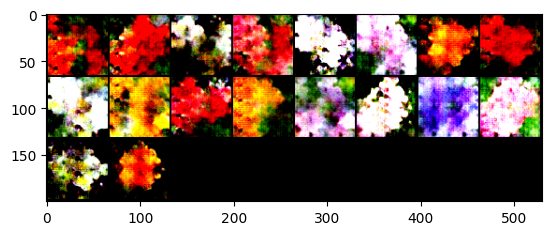

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 11, lossD:2.0036053298746497, lossG:2.0537132881220104,lossG_fake:1.0635335966221338, lossG_real:0.9901796990227931 ,equality:0.07335389759934063


evaluate:100.70823669433594,kid_mean:0.059013091027736664, kid_std:0.033937156200408936,kid_:(tensor(0.0590), tensor(0.0339))


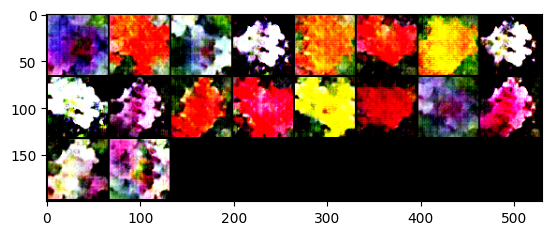

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 12, lossD:2.006427954701544, lossG:2.055999855393345,lossG_fake:1.0562858645198414, lossG_real:0.9997139798784719 ,equality:0.05657188464136953


evaluate:104.13932037353516,kid_mean:0.05845652520656586, kid_std:0.03123803623020649,kid_:(tensor(0.0585), tensor(0.0312))


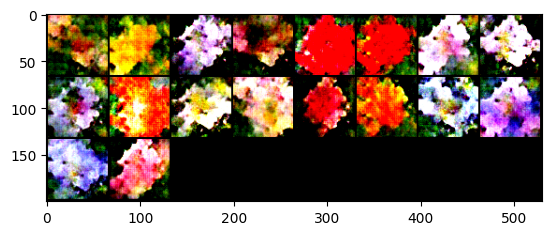

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 13, lossD:2.00738442407071, lossG:2.065901503979581,lossG_fake:1.0502032782267599, lossG_real:1.0156982251741353 ,equality:0.034505053052624524


evaluate:106.00031280517578,kid_mean:0.06503691524267197, kid_std:0.033038388937711716,kid_:(tensor(0.0650), tensor(0.0330))


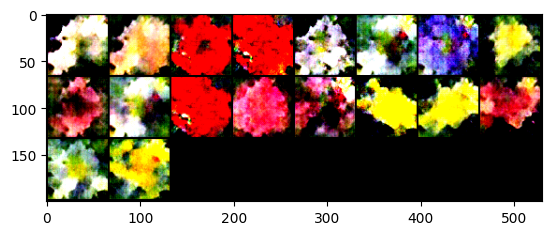

100%|██████████| 103/103 [01:37<00:00,  1.05it/s]


epoch: 14, lossD:2.014832659832482, lossG:2.0811889368353538,lossG_fake:1.0690674839667904, lossG_real:1.0121214580767364 ,equality:0.05694602589005404


evaluate:109.86561584472656,kid_mean:0.06686060130596161, kid_std:0.038565684109926224,kid_:(tensor(0.0669), tensor(0.0386))


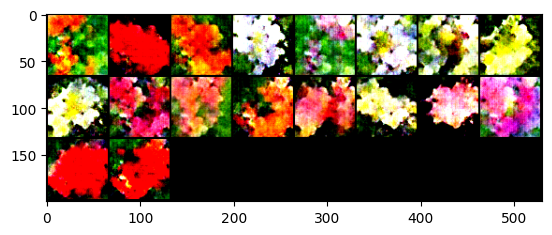

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 15, lossD:1.9972955150511658, lossG:2.0639282893208626,lossG_fake:1.0535202142104363, lossG_real:1.0104080791612273 ,equality:0.043112135049208966


evaluate:112.4063491821289,kid_mean:0.07172665745019913, kid_std:0.03648985177278519,kid_:(tensor(0.0717), tensor(0.0365))


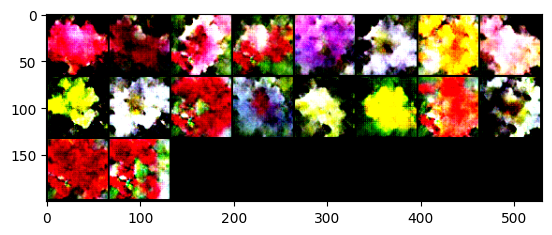

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 16, lossD:2.0024097266706447, lossG:2.068670474209832,lossG_fake:1.0441169183231094, lossG_real:1.0245535500998635 ,equality:0.01956336822324589


evaluate:112.05501556396484,kid_mean:0.07260407507419586, kid_std:0.0325055830180645,kid_:(tensor(0.0726), tensor(0.0325))


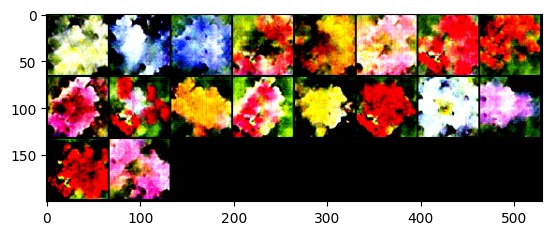

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 17, lossD:2.0073996597123376, lossG:2.06270815562276,lossG_fake:1.034487504403568, lossG_real:1.0282206575847366 ,equality:0.006266846818831384


evaluate:112.69219207763672,kid_mean:0.07426378130912781, kid_std:0.0385710671544075,kid_:(tensor(0.0743), tensor(0.0386))


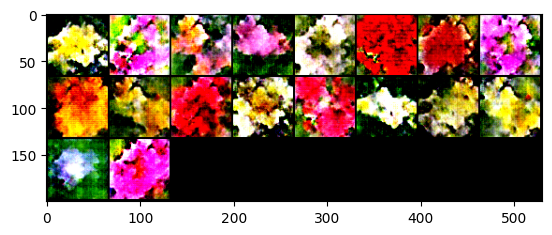

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 18, lossD:2.008824482704829, lossG:2.0807803302135284,lossG_fake:1.056042234874466, lossG_real:1.024738105176722 ,equality:0.0313041296977441


evaluate:111.0859603881836,kid_mean:0.06788863241672516, kid_std:0.033572547137737274,kid_:(tensor(0.0679), tensor(0.0336))


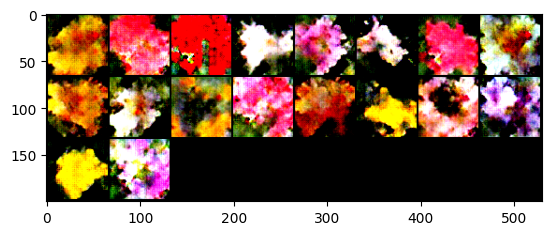

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 19, lossD:1.9984259964192954, lossG:2.069969649453765,lossG_fake:1.053071637176773, lossG_real:1.0168980024393321 ,equality:0.03617363473744084


evaluate:114.7861557006836,kid_mean:0.08366291224956512, kid_std:0.04053398221731186,kid_:(tensor(0.0837), tensor(0.0405))


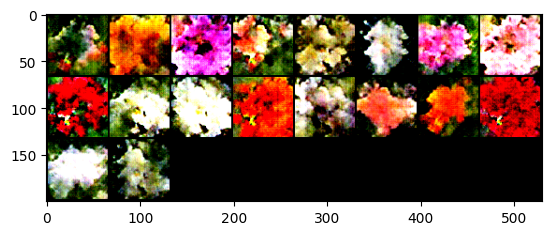

100%|██████████| 103/103 [01:37<00:00,  1.05it/s]


epoch: 20, lossD:2.0000451317111265, lossG:2.0699022927330537,lossG_fake:1.0550537456586524, lossG_real:1.0148485574907469 ,equality:0.040205188167905526


evaluate:112.72537994384766,kid_mean:0.07457559555768967, kid_std:0.040939267724752426,kid_:(tensor(0.0746), tensor(0.0409))


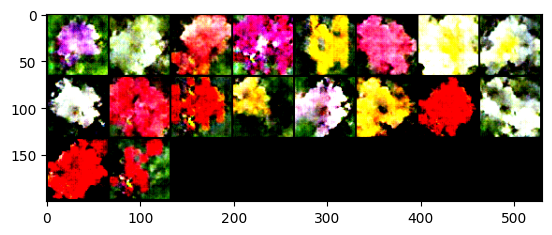

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 21, lossD:1.9988178385114206, lossG:2.08622513465511,lossG_fake:1.0634373808370052, lossG_real:1.022787751503361 ,equality:0.040649629333644244


evaluate:114.40633392333984,kid_mean:0.07496144622564316, kid_std:0.04099814221262932,kid_:(tensor(0.0750), tensor(0.0410))


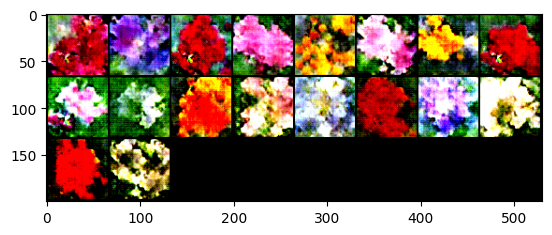

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 22, lossD:1.99279813048909, lossG:2.1089483048151996,lossG_fake:1.08596946487149, lossG_real:1.0229788318421076 ,equality:0.06299063302938235


evaluate:114.1789779663086,kid_mean:0.0734734833240509, kid_std:0.03383664786815643,kid_:(tensor(0.0735), tensor(0.0338))


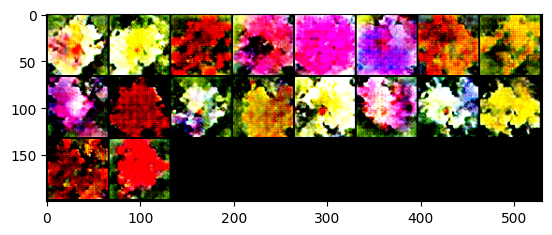

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 23, lossD:2.0116449397744485, lossG:2.1323896056240046,lossG_fake:1.0860808098200456, lossG_real:1.046308795803959 ,equality:0.039772014016086654


evaluate:113.6794204711914,kid_mean:0.07384590059518814, kid_std:0.03876960650086403,kid_:(tensor(0.0738), tensor(0.0388))


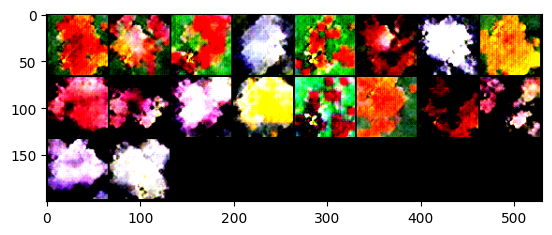

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 24, lossD:1.9785619210271002, lossG:2.119004198648397,lossG_fake:1.0852444495969606, lossG_real:1.0337597455793215 ,equality:0.05148470401763916


evaluate:116.07662963867188,kid_mean:0.08163448423147202, kid_std:0.04197688400745392,kid_:(tensor(0.0816), tensor(0.0420))


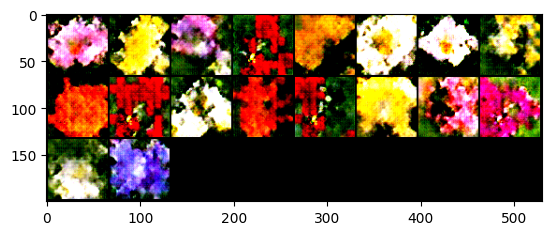

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 25, lossD:1.9773481216245485, lossG:2.121760338255503,lossG_fake:1.0821382634848067, lossG_real:1.0396220788214972 ,equality:0.04251618466330953


evaluate:116.43277740478516,kid_mean:0.08184114098548889, kid_std:0.036450255662202835,kid_:(tensor(0.0818), tensor(0.0365))


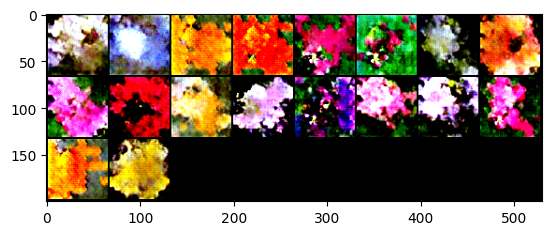

100%|██████████| 103/103 [01:37<00:00,  1.05it/s]


epoch: 26, lossD:1.9828949564868965, lossG:2.166785448500254,lossG_fake:1.1076682076870816, lossG_real:1.0591172384984284 ,equality:0.048550969188653204


evaluate:115.03634643554688,kid_mean:0.07612660527229309, kid_std:0.04470429942011833,kid_:(tensor(0.0761), tensor(0.0447))


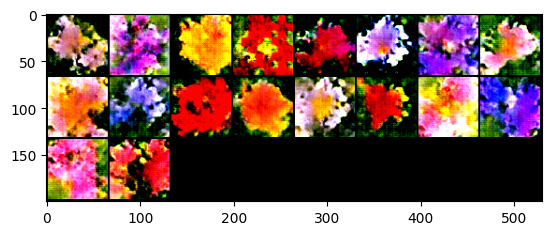

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 27, lossD:1.9727652605297497, lossG:2.18909377264745,lossG_fake:1.1136057266911257, lossG_real:1.075488043641581 ,equality:0.03811768304954466


evaluate:115.06554412841797,kid_mean:0.08374609053134918, kid_std:0.042110491544008255,kid_:(tensor(0.0837), tensor(0.0421))


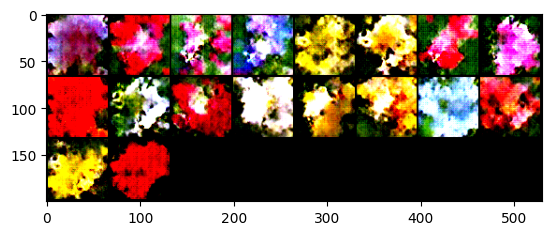

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 28, lossD:1.9611914238883454, lossG:2.1780684434094475,lossG_fake:1.1156129860183568, lossG_real:1.062455461441892 ,equality:0.05315752457646483


evaluate:115.63606262207031,kid_mean:0.07851542532444, kid_std:0.04029730334877968,kid_:(tensor(0.0785), tensor(0.0403))


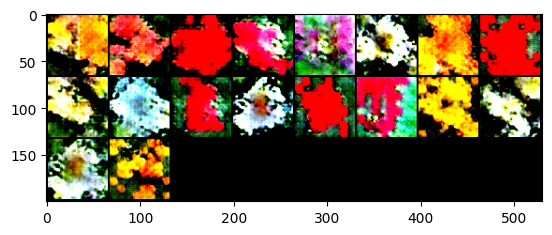

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 29, lossD:1.9540472123229389, lossG:2.2532725658231567,lossG_fake:1.1542778616970024, lossG_real:1.0989947104916988 ,equality:0.05528315120530358


evaluate:113.9237289428711,kid_mean:0.06982533633708954, kid_std:0.03476556017994881,kid_:(tensor(0.0698), tensor(0.0348))


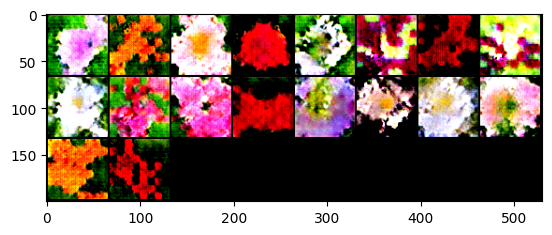

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 30, lossD:1.9238569458711494, lossG:2.3359247295601855,lossG_fake:1.2082737684249878, lossG_real:1.1276509524549094 ,equality:0.08062281597007837


evaluate:114.17196655273438,kid_mean:0.07578292489051819, kid_std:0.03335687518119812,kid_:(tensor(0.0758), tensor(0.0334))


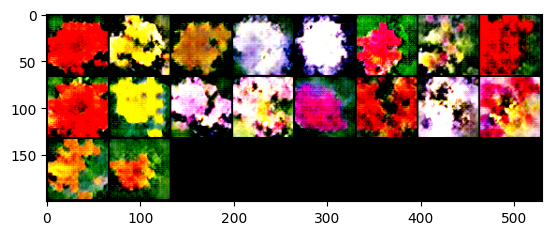

100%|██████████| 103/103 [01:37<00:00,  1.05it/s]


epoch: 31, lossD:1.8906078651113418, lossG:2.4307605248053097,lossG_fake:1.2573402246225227, lossG_real:1.173420296131986 ,equality:0.08391992849053675


evaluate:114.62727355957031,kid_mean:0.07924414426088333, kid_std:0.040356554090976715,kid_:(tensor(0.0792), tensor(0.0404))


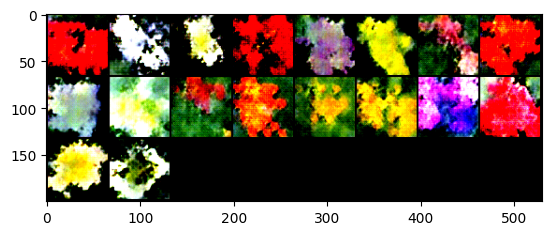

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 32, lossD:1.8068137759143867, lossG:2.567680136671344,lossG_fake:1.3302085769986642, lossG_real:1.2374715371039307 ,equality:0.09273703989473359


evaluate:110.8646011352539,kid_mean:0.08004111051559448, kid_std:0.0465453565120697,kid_:(tensor(0.0800), tensor(0.0465))


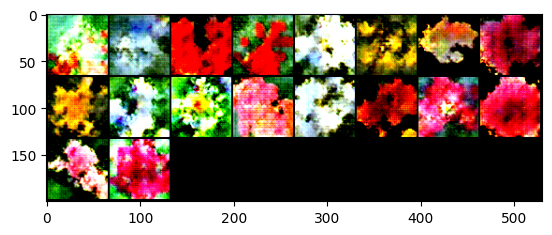

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 33, lossD:1.7810463997924213, lossG:2.63757828138407,lossG_fake:1.3578185005095398, lossG_real:1.2797597970777346 ,equality:0.07805870343180521


evaluate:109.97210693359375,kid_mean:0.0745089054107666, kid_std:0.0382821187376976,kid_:(tensor(0.0745), tensor(0.0383))


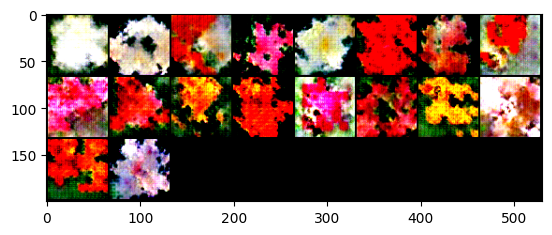

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 34, lossD:1.6617370137890566, lossG:2.9908148872042166,lossG_fake:1.5480405775088708, lossG_real:1.4427743149035186 ,equality:0.10526626260535221


evaluate:109.50858306884766,kid_mean:0.07029116898775101, kid_std:0.034722212702035904,kid_:(tensor(0.0703), tensor(0.0347))


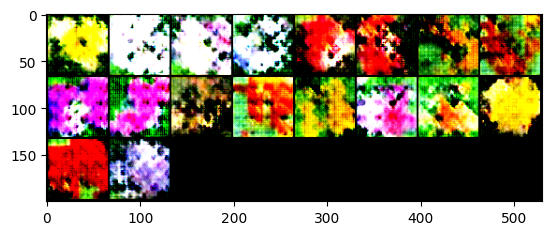

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 35, lossD:1.4611792194033133, lossG:3.369043058562047,lossG_fake:1.7585185476877156, lossG_real:1.6105245114530173 ,equality:0.1479940362346983


evaluate:110.94873809814453,kid_mean:0.07670484483242035, kid_std:0.04084138944745064,kid_:(tensor(0.0767), tensor(0.0408))


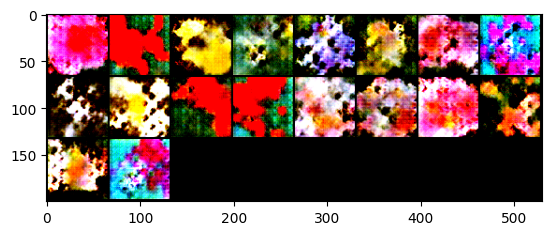

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 36, lossD:1.3881266759437265, lossG:3.575302360127273,lossG_fake:1.8454436086913915, lossG_real:1.7298587439129653 ,equality:0.11558486477842611


evaluate:112.42427062988281,kid_mean:0.0769801065325737, kid_std:0.03510182723402977,kid_:(tensor(0.0770), tensor(0.0351))


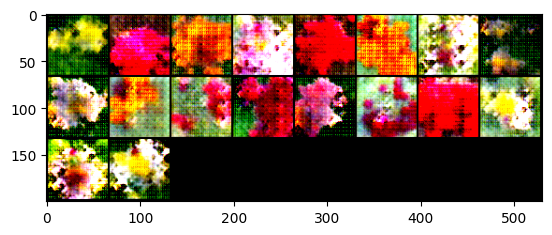

100%|██████████| 103/103 [01:37<00:00,  1.05it/s]


epoch: 37, lossD:1.142273074504241, lossG:4.163628636054622,lossG_fake:2.1664036616538334, lossG_real:1.9972249628270713 ,equality:0.16917869882676206


evaluate:112.41988372802734,kid_mean:0.07694441825151443, kid_std:0.039776161313056946,kid_:(tensor(0.0769), tensor(0.0398))


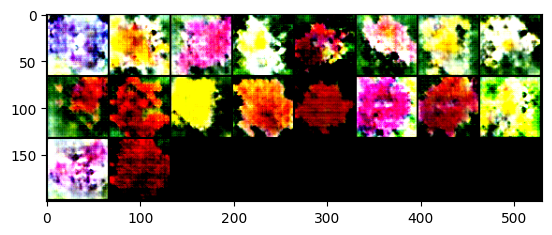

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 38, lossD:0.8952071276104566, lossG:4.637764625178957,lossG_fake:2.392551076643675, lossG_real:2.2452135653171723 ,equality:0.14733751132650275


evaluate:112.7276611328125,kid_mean:0.0722179040312767, kid_std:0.03987908735871315,kid_:(tensor(0.0722), tensor(0.0399))


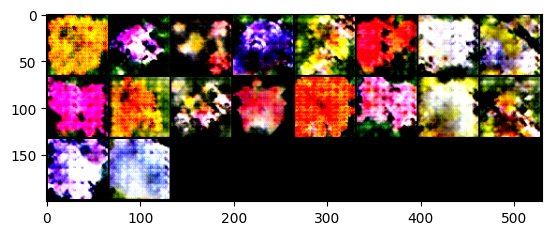

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 39, lossD:0.9112219353324001, lossG:4.757099001153001,lossG_fake:2.4501966700970548, lossG_real:2.306902307908512 ,equality:0.14329436218854275


evaluate:110.56198120117188,kid_mean:0.07522706687450409, kid_std:0.04143981635570526,kid_:(tensor(0.0752), tensor(0.0414))


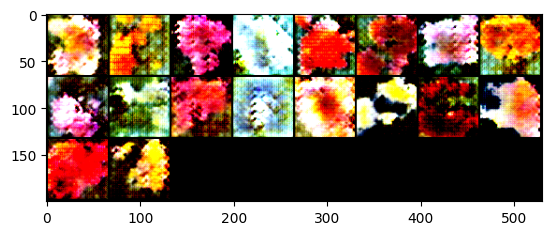

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 40, lossD:0.8340606349475176, lossG:4.755558259278825,lossG_fake:2.479190540545195, lossG_real:2.276367733779463 ,equality:0.20282280676573183


evaluate:110.16798400878906,kid_mean:0.07176725566387177, kid_std:0.04090449959039688,kid_:(tensor(0.0718), tensor(0.0409))


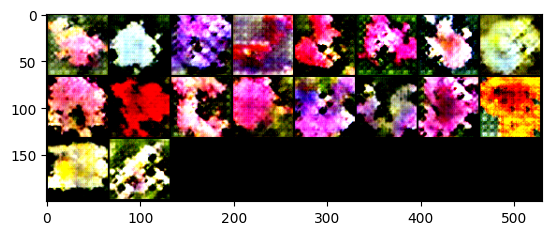

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 41, lossD:0.7356965459376863, lossG:5.12944230755556,lossG_fake:2.6315086790658895, lossG_real:2.4979336284896703 ,equality:0.1335750505762192


evaluate:111.32164764404297,kid_mean:0.07448810338973999, kid_std:0.03656653314828873,kid_:(tensor(0.0745), tensor(0.0366))


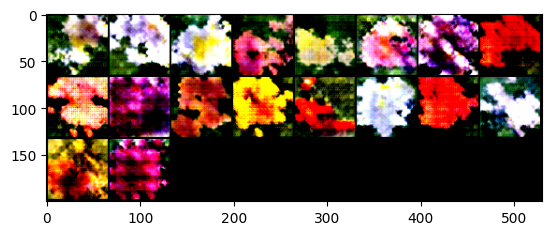

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 42, lossD:0.6780886574132928, lossG:5.305643965897051,lossG_fake:2.7297830558517604, lossG_real:2.5758608949994577 ,equality:0.1539221608523027


evaluate:110.40894317626953,kid_mean:0.07575277984142303, kid_std:0.03661811724305153,kid_:(tensor(0.0758), tensor(0.0366))


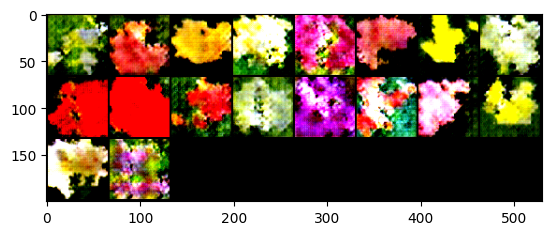

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 43, lossD:0.7895675038973105, lossG:5.26560409323683,lossG_fake:2.691407686298333, lossG_real:2.5741964080958692 ,equality:0.11721127820246391


evaluate:111.15670776367188,kid_mean:0.07347270101308823, kid_std:0.0354677177965641,kid_:(tensor(0.0735), tensor(0.0355))


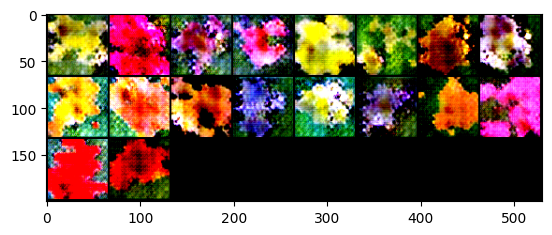

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 44, lossD:0.7681388567084247, lossG:5.242602653873777,lossG_fake:2.7014163246432554, lossG_real:2.541186322286291 ,equality:0.16023000235696427


evaluate:110.62754821777344,kid_mean:0.07183092832565308, kid_std:0.03559151664376259,kid_:(tensor(0.0718), tensor(0.0356))


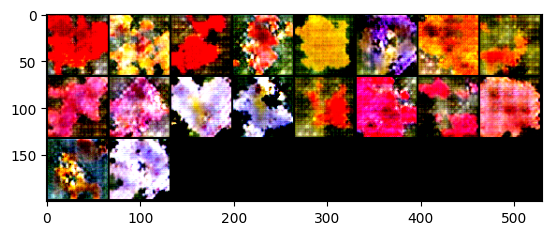

100%|██████████| 103/103 [01:36<00:00,  1.06it/s]


epoch: 45, lossD:0.6507658042302988, lossG:5.5777368128878395,lossG_fake:2.829979116476855, lossG_real:2.747757721873163 ,equality:0.08222139460369204


evaluate:110.59689331054688,kid_mean:0.0740317702293396, kid_std:0.038968805223703384,kid_:(tensor(0.0740), tensor(0.0390))


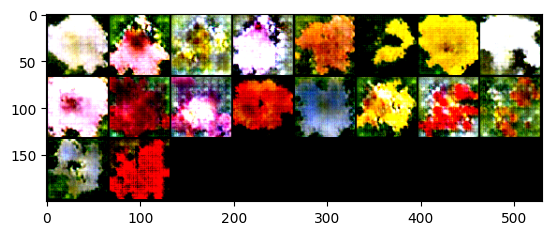

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 46, lossD:0.5750844133927405, lossG:5.850885976865453,lossG_fake:2.914636964936858, lossG_real:2.936249014243339 ,equality:-0.021612049306480863


evaluate:111.00885772705078,kid_mean:0.07084117084741592, kid_std:0.03631019964814186,kid_:(tensor(0.0708), tensor(0.0363))


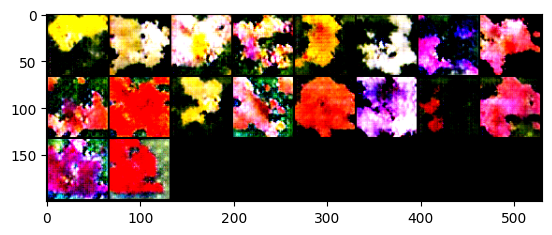

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 47, lossD:0.6181592190439261, lossG:5.694839898822377,lossG_fake:2.9307614981549457, lossG_real:2.76407838677897 ,equality:0.16668311137597547


evaluate:110.57943725585938,kid_mean:0.0729733482003212, kid_std:0.03634633123874664,kid_:(tensor(0.0730), tensor(0.0363))


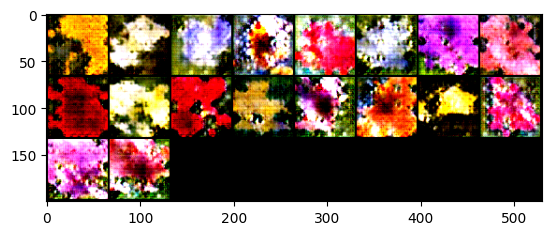

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 48, lossD:0.5404274993151137, lossG:5.829000699867323,lossG_fake:2.9773362863411026, lossG_real:2.8516643892214137 ,equality:0.12567189711968885


evaluate:111.14196014404297,kid_mean:0.07245190441608429, kid_std:0.03904052823781967,kid_:(tensor(0.0725), tensor(0.0390))


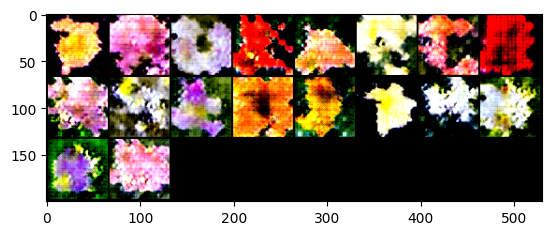

100%|██████████| 103/103 [01:37<00:00,  1.06it/s]


epoch: 49, lossD:0.6990351675494203, lossG:5.789352486434492,lossG_fake:2.973454102729131, lossG_real:2.8158983799439032 ,equality:0.15755572278522756


evaluate:112.81687927246094,kid_mean:0.07502167671918869, kid_std:0.037426337599754333,kid_:(tensor(0.0750), tensor(0.0374))


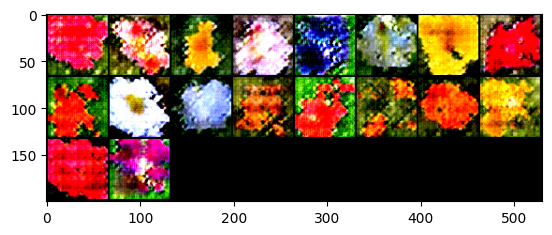

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

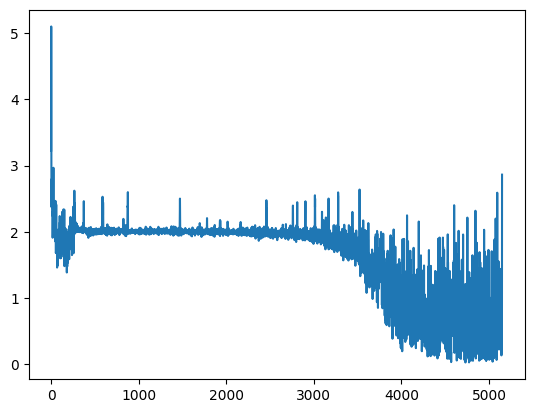

In [45]:
plt.plot(raw_lossesD)

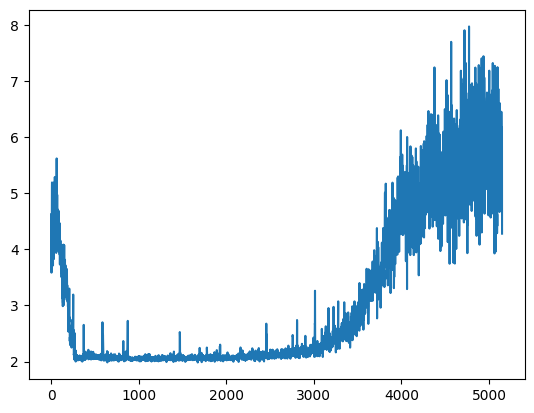

In [46]:
plt.plot(raw_lossesG)

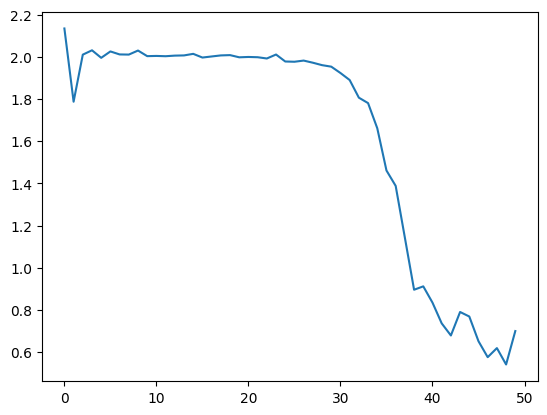

In [47]:
plt.plot(lossesD)

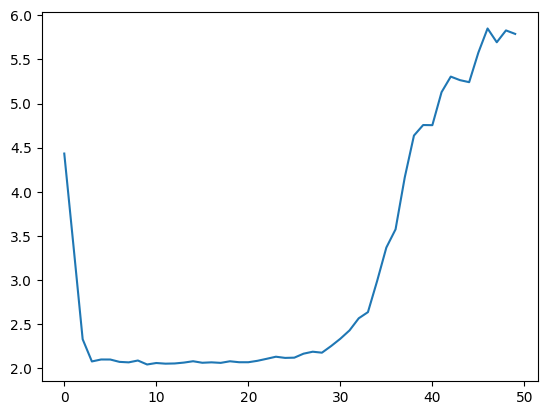

In [48]:
plt.plot(lossesG)

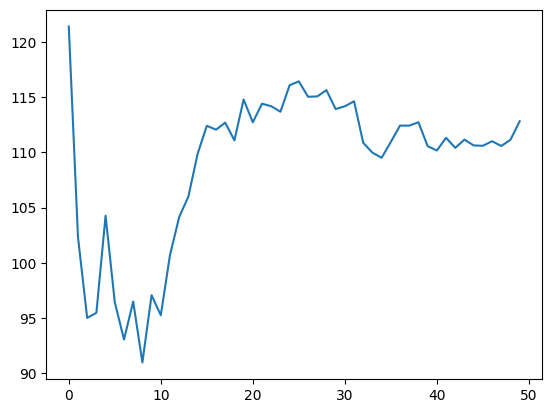

In [49]:
plt.plot(fid_)

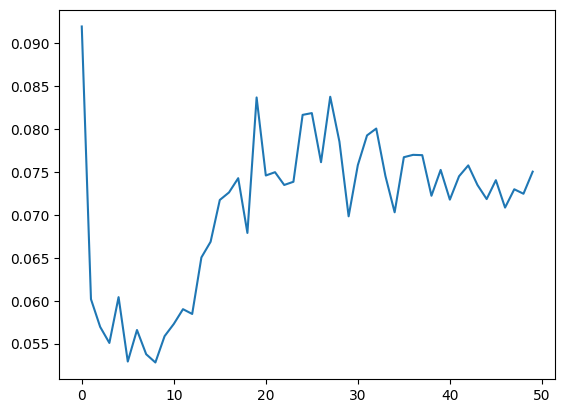

In [50]:
plt.plot(kid_mean_)

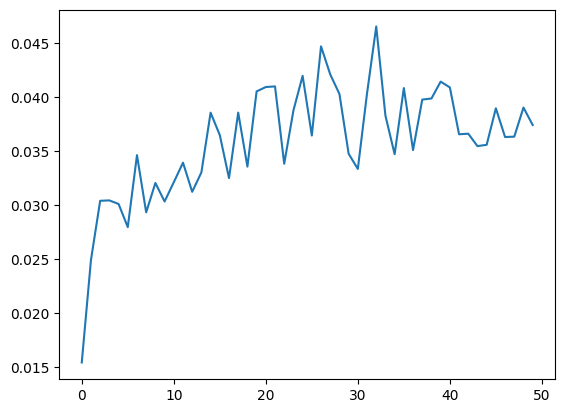

In [51]:
plt.plot(kid_std_)

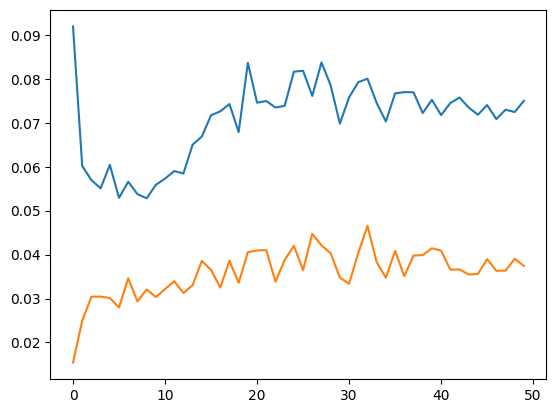

In [52]:
plt.plot(kid_score)

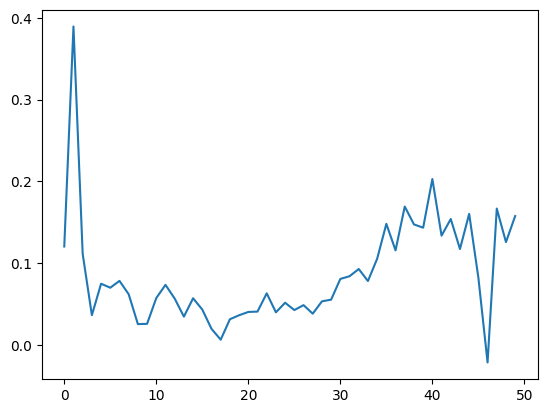

In [53]:
plt.plot(d_equality)

In [54]:

import torch
!pip install torcheval


from torcheval.metrics import PeakSignalNoiseRatio
import torch
import torchvision
#from torcheval.metrics import StructuralSimilarity

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
print(f'fid ',fid.compute())

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
print(f'kid ',kid.compute())

metric = PeakSignalNoiseRatio()
#input = torch.tensor([[0.1, 0.2], [0.3, 0.4]])
#>>> target = input * 0.9
metric.update(fake_imgs,real_imgs)
print(f'PSNR',metric.compute())#高いほどいい
#PSNR (Peak Signal-to-Noise Ratio): PSNRは、生成画像と本物の画像の間のノイズの量を測定します。高いPSNRは、より低いノイズレベルを示します。

import torch
from skimage.metrics import structural_similarity as ssim
import numpy as np

# 例えば、real_imageが与えられているとします
real_image =real_imgs # 仮のランダムな画像データ
fake_image =fake_imgs
# PyTorch TensorをNumPy配列に変換
real_image_np = real_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
real_image_np = np.clip((real_image_np + 1) / 2.0, 0, 1)

# PyTorch TensorをNumPy配列に変換
fake_image_np = fake_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
fake_image_np = np.clip((fake_image_np + 1) / 2.0, 0, 1)

# SSIMを計算
ssim_value = ssim(real_image_np[0], fake_image_np[0], win_size=3)
print(f"SSIM値: {ssim_value}")
#SSIMは、画像の品質を評価するための指標であり、生成画像と本物の画像の構造的な類似性を測定します。1に近い値が高い品質を示します。

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 3.8 MB/s eta 0:00:00
fid  tensor(114.4271)
kid  (tensor(0.0718), tensor(0.0392))
PSNR tensor(69.2586)
SSIM値: 0.9873873026748885
